# Data visualization
First, note that the dataset contains only 3 purely numerical features, but a lot of information in categorical or textual form. Can you quantify that in any way? Define and compute two derived numerical features of your own, for instance the number of languages spoken, length of answers to the open questions,  the number of "I" or "you" occurrences,  the dominant sentiment expressed (take a peek at the NLP module..) etc.

Then explore this customized dataset by creating at least one chart out of every main category in the Chart Guide poster (Links to an external site.) (the ones with a coloured background, there are 6). For more inspiration and examples of Python code, check The Python Graph Gallery (Links to an external site.).

In [33]:
import numpy as np
import datetime
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

sns.set()
%matplotlib inline

In [34]:
data = pd.read_csv('datasets/profiles.csv')

In [35]:
data = data[data.age < 70]
data.height = data.height * 2.54
data = data[(data.height > 140) & (data.height < 210)]
data = data.rename(columns={'height': 'heightcm'})
data.dropna(inplace=True)

In [36]:
data.info()
dating = data.copy()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4398 entries, 0 to 59944
Data columns (total 31 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          4398 non-null   int64  
 1   body_type    4398 non-null   object 
 2   diet         4398 non-null   object 
 3   drinks       4398 non-null   object 
 4   drugs        4398 non-null   object 
 5   education    4398 non-null   object 
 6   essay0       4398 non-null   object 
 7   essay1       4398 non-null   object 
 8   essay2       4398 non-null   object 
 9   essay3       4398 non-null   object 
 10  essay4       4398 non-null   object 
 11  essay5       4398 non-null   object 
 12  essay6       4398 non-null   object 
 13  essay7       4398 non-null   object 
 14  essay8       4398 non-null   object 
 15  essay9       4398 non-null   object 
 16  ethnicity    4398 non-null   object 
 17  heightcm     4398 non-null   float64
 18  income       4398 non-null   int64  
 19  job  

In [37]:
stor = {}

In [38]:
def to_cat(label):
    print(label)
    labelencoder = LabelEncoder()
    aa = labelencoder.fit_transform(dating[label].astype(str))
    dating[label] = dating[label].astype(object)
    dating[label] = aa
    stor[label] = labelencoder.classes_
    dating[label] = dating[label].astype(int)
for lbl in ['body_type','diet','drinks','drugs','education','ethnicity','job','location','offspring','orientation','pets','sex','sign','smokes','speaks','status','religion']:
    to_cat(lbl)

body_type
diet
drinks
drugs
education
ethnicity
job
location
offspring
orientation
pets
sex
sign
smokes
speaks
status
religion


In [39]:
dating = dating.drop(columns=['last_online', 'essay0', 'essay1', 'essay2', 'essay3', 'essay4', 'essay5', 'essay6', 'essay7', 'essay8', 'essay9'])

In [40]:
dating.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4398 entries, 0 to 59944
Data columns (total 20 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          4398 non-null   int64  
 1   body_type    4398 non-null   int64  
 2   diet         4398 non-null   int64  
 3   drinks       4398 non-null   int64  
 4   drugs        4398 non-null   int64  
 5   education    4398 non-null   int64  
 6   ethnicity    4398 non-null   int64  
 7   heightcm     4398 non-null   float64
 8   income       4398 non-null   int64  
 9   job          4398 non-null   int64  
 10  location     4398 non-null   int64  
 11  offspring    4398 non-null   int64  
 12  orientation  4398 non-null   int64  
 13  pets         4398 non-null   int64  
 14  religion     4398 non-null   int64  
 15  sex          4398 non-null   int64  
 16  sign         4398 non-null   int64  
 17  smokes       4398 non-null   int64  
 18  speaks       4398 non-null   int64  
 19  statu

# Comparison between categories

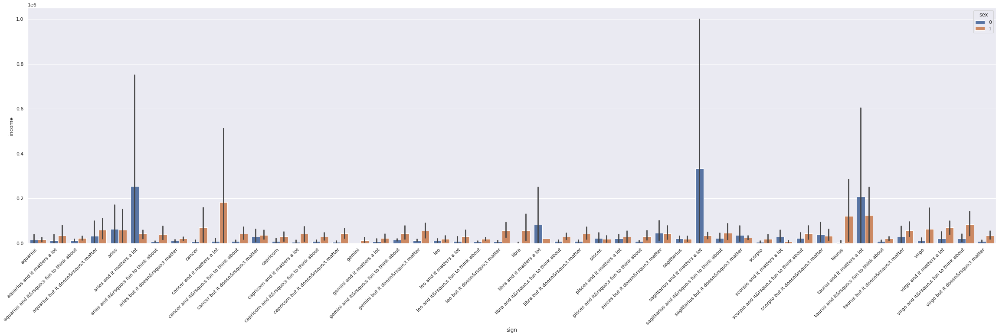

In [41]:
fig, ax = plt.subplots(figsize=(40,10))
sns.barplot(x='sign', y='income', hue='sex', data=dating, ax=ax)

ax.set_xticklabels(stor['sign'], rotation=45, ha='right')
plt.show()

<AxesSubplot:xlabel='smokes', ylabel='income'>

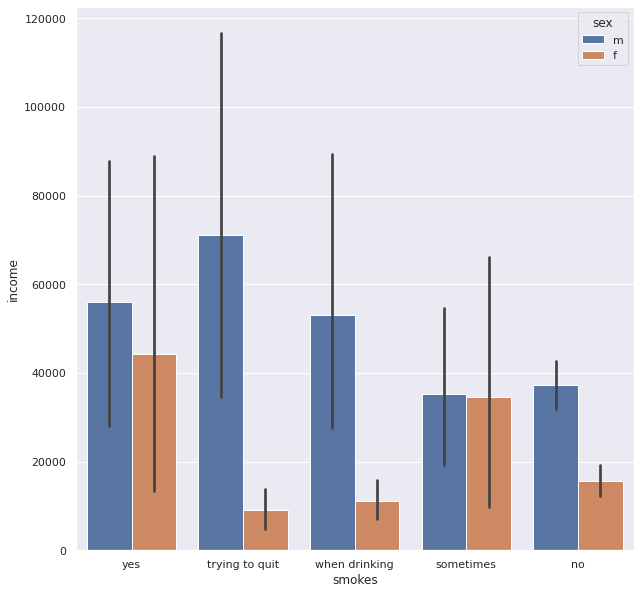

In [42]:
fig, ax = plt.subplots(figsize=(10,10))
sns.barplot(x='smokes', y='income', hue='sex', order=['yes', 'trying to quit', 'when drinking', 'sometimes', 'no'], data=data, ax=ax)

# Relation between the data elements 

<AxesSubplot:>

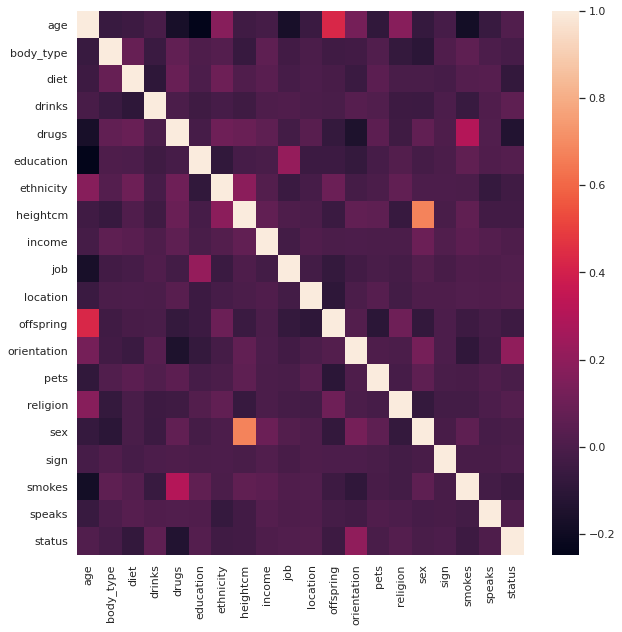

In [43]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(dating.corr(), ax =ax)

# Distribution of the dataset

<AxesSubplot:xlabel='smokes', ylabel='age'>

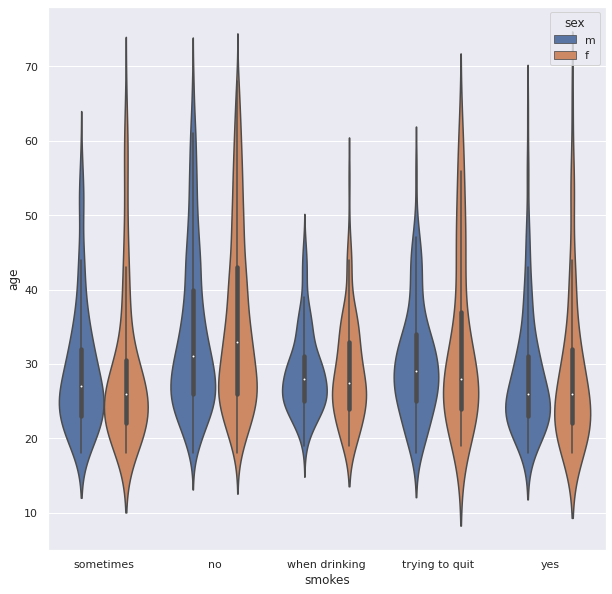

In [44]:
fig, ax = plt.subplots(figsize=(10,10))
sns.violinplot(data=data, x="smokes", y="age", hue="sex", ax=ax)

<AxesSubplot:xlabel='sex', ylabel='heightcm'>

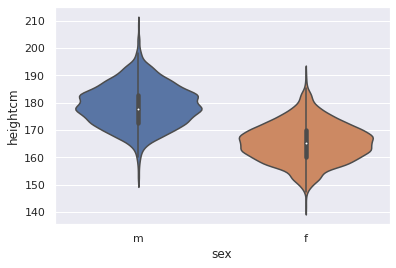

In [45]:
sns.violinplot(data = data, x='sex', y='heightcm')

# Over time or trend

In [46]:
# the data does not consist of datetime data; last_online is something that does not make sense for time series

# Part to whole relation

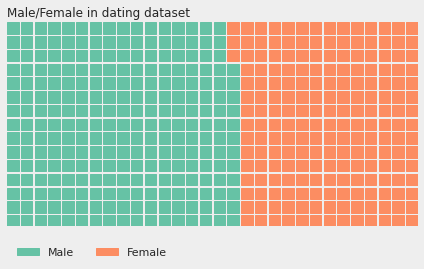

In [47]:
from pywaffle import Waffle
s = values=dating['sex'].value_counts(normalize=True) * 100

fig = plt.figure(
    FigureClass=Waffle,
    values=s,
    columns=30,
    rows=15,
    labels=['Male', 'Female'],
    title={'label': 'Male/Female in dating dataset', 'loc': 'left'},
    legend={'loc': 'lower left', 'bbox_to_anchor': (0, -0.2), 'ncol': len(s), 'framealpha': 0}
)
fig.gca().set_facecolor('#EEEEEE')
fig.set_facecolor('#EEEEEE')
plt.show()

# Other

In [92]:
import sweetviz as sv
advert_report = sv.analyze(data)
advert_report.show_html('Advertising.html')

:FEATURES DONE:                    |█████████████████████| [100%]   00:06  -> (00:00 left)
:PAIRWISE DONE:                    |█████████████████████| [100%]   00:05  -> (00:00 left)
Creating Associations graph... DONE!
Report Advertising.html was generated! NOTEBOOK/COLAB USERS: no browser will pop up, the report is saved in your notebook/colab files.


In [93]:
from sklearn.manifold import TSNE
%matplotlib inline

In [94]:
dating.dropna(inplace=True)
dating_y = dating['drinks']
dadada = dating.drop(columns='drinks')
X_tsne = TSNE(n_components=2, n_jobs=-1).fit_transform(dadada)

df = pd.DataFrame(dadada, columns=dadada.columns)

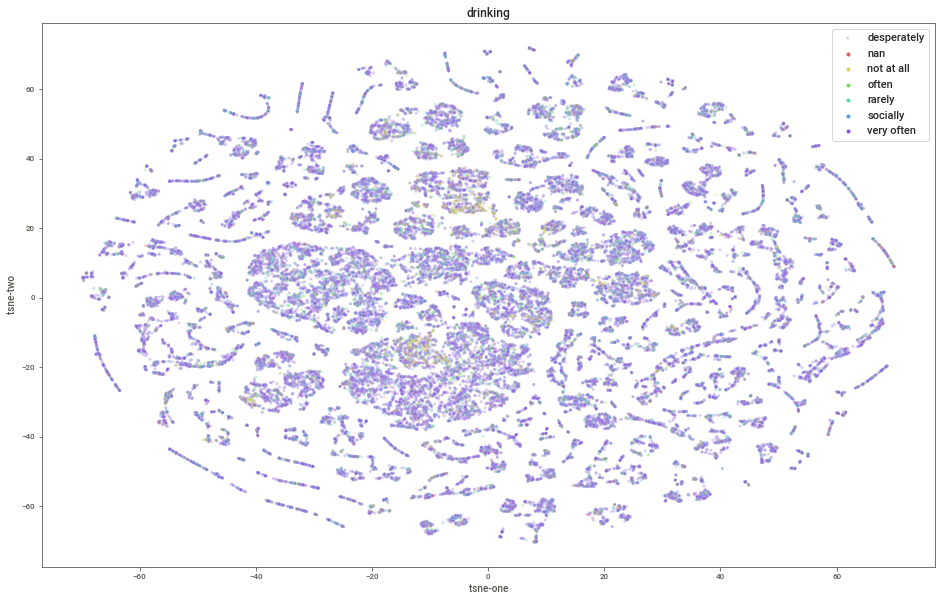

In [95]:
df['y'] = dating_y
df['tsne-one'] = X_tsne[:,0]
df['tsne-two'] = X_tsne[:,1]
plt.figure(figsize=(16,10))

g = sns.scatterplot(x="tsne-one", y="tsne-two", hue="y", palette=sns.color_palette("hls", len(dating['drinks'].unique())), data=df, legend="full", alpha=0.3)
new_labels = stor['drinks']
plt.title('drinking')
plt.legend(new_labels)